In [2]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import sys

%matplotlib inline
%load_ext autoreload
%autoreload 2
#%load_ext rmagic
#import random
#random.seed(30)

import matplotlib as mpl
#mpl.rcParams['figure.figsize'] = (9,6)
#sns.set(rc={'figure.figsize':(9,6)})
sc.set_figure_params(dpi = 300)

prefix = 'paper-data/'
output_prefix = 'paper/'
sc._settings.figdir = output_prefix + 'figs/'


def read_welsh():
    def read_mtx(filepath_prefix):
        mtx = sc.read_mtx(filepath_prefix + '_matrix.mtx')
        #print(mtx.obs_names)
        mtx = mtx.T
        obs = pd.read_csv(filepath_prefix + '_barcodes.csv', index_col = 'barcode')
        var = pd.read_csv(filepath_prefix + '_genes.csv', index_col = 'gene')
        mtx.obs_names = obs.index
        mtx.var_names = var.index
        return mtx
    
    paths = ["GSE126836_SN_MD5534",  
         "GSE126836_SN_MD5828",  
         "GSE126836_SN_MD5840",
         "GSE126836_SN_MD5862",
         "GSE126836_SN_MD5893",
         "GSE126836_SN_MD6060",  
         "GSE126836_SN_MD6063"]
    
    l = []
    for p in paths:
        print('Reading', p)
        ann_read = read_mtx('postmortem-human/' + p)
        ann_read.obs['sample'] = p
        l.append(ann_read)
    ann = sc.AnnData.concatenate(*l)
    ann.obs['sample'] = list(zip(*ann.obs.index.str.split('_')))[0]
    ann.obs['donor'] = list(ann.obs['sample'].apply(lambda x : x[2:-1]))
    ann.obs['barcode'] = list(zip(*ann.obs.index.str.split('_')))[1]
    ann.raw = ann
    return ann



In [3]:

ann_welsh = read_welch()
ann_welsh.obs['dataset'] = 'welsh'



GSM4157067


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


GSM4157068


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


GSM4157069


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


GSM4157070


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


GSM4157071


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


GSM4157072


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


GSM4157073


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


GSM4157074


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


GSM4157075


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


GSM4157076


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


GSM4157077


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


GSM4157078


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Making variable names unique for controlled concatenation.


In [28]:

def merge_clusters(adata_work, clusters, output_tag, tag = 'louvain'):
    cat = adata_work.obs[tag].astype(str)
    cells_found = cat.isin(clusters)
    cat[cells_found] = '.'.join(clusters)
    adata_work.obs[output_tag] = cat.astype('category')
    #return adata_work

def proccess_postmortem(ann):
    sc.pp.log1p(ann,copy=False)
    #sc.pp.highly_variable_genes(ann)
    sc.pp.highly_variable_genes(ann, batch_key='sample')
    ann.var['highly_variable'] = ann.var['highly_variable_intersection']
    #ann.var['highly_variable'] = ann.var['highly_variable_nbatches'] > 20
    sc.pp.pca(ann, use_highly_variable=True)
    sc.pp.neighbors(ann)
    sc.tl.umap(ann)
    sc.pl.pca_overview(ann)
    sc.tl.louvain(ann,resolution=0.3)
    output_tag = 'merged_louvain'
    merge_clusters(ann, ['0','1'], output_tag)
    merge_clusters(ann, ['5', '7'], output_tag, tag = output_tag)

    aliases_context = {'0.1':'Oligodendrocytes', 
               '3': 'Astrocytes',
               '2': 'OPC', 
               '4' : 'Microglia', 
               '5.7':'Neurons',
               '6':'MUR'
        }
    ann.obs['Cell Types'] = ann.obs[output_tag].cat.rename_categories(aliases_context)    

    
ann_welsh.raw = ann_welsh    
proccess_postmortem(ann_welsh)



sc.write('paper-data/welch-human-postmortem-processed-with-raw.h5ad',ann_welsh)


In [3]:
ann = sc.read_h5ad('paper-data/welch-human-postmortem-processed.h5ad')
ann
#proccess_postmortem(ann)


AnnData object with n_obs × n_vars = 40453 × 29445 
    obs: 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'sample', 'donor', 'barcode', 'louvain', 'merged_louvain', 'Cell Types', 'old_louvain'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Cell Types_colors', 'donor_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [3]:

ann_welch = sc.read_h5ad('paper-data/welsh-human-postmortem-processed-with-raw.h5ad')


AnnData object with n_obs × n_vars = 40453 × 29445 
    obs: 'batch', 'sample', 'donor', 'barcode', 'dataset', 'louvain', 'merged_louvain', 'Cell Types'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'louvain', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [56]:
#sc.pl.umap(ann_welsh, color = 'TH')

from scipy.io import mmwrite

ann_welch.var.index.name = 'index'
ann_welch.obs.index.name = 'index'
mmwrite('paper-data/welch-SN.mtx', ann_welsh.raw.X)
ann_welch.var.to_csv('paper-data/welch-SN_gene-metadata.csv')
ann_welch.obs.to_csv('paper-data/welch-SN_cell-metadata.csv')

In [6]:
#sc.pl.umap(ann_webber, color = ['louvain','total_counts']).
markers = ['MGP','PLXDC1','P2RY12','SYT1','GAD1','MOBP','OLIG1','SLC17A6']

sc.pl.umap(ann_welch, color = ['louvain','Cell Types','TH','AQP4'] + markers, use_raw = False)



C:\Users\patou\AppData\Roaming\Python\Python36\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


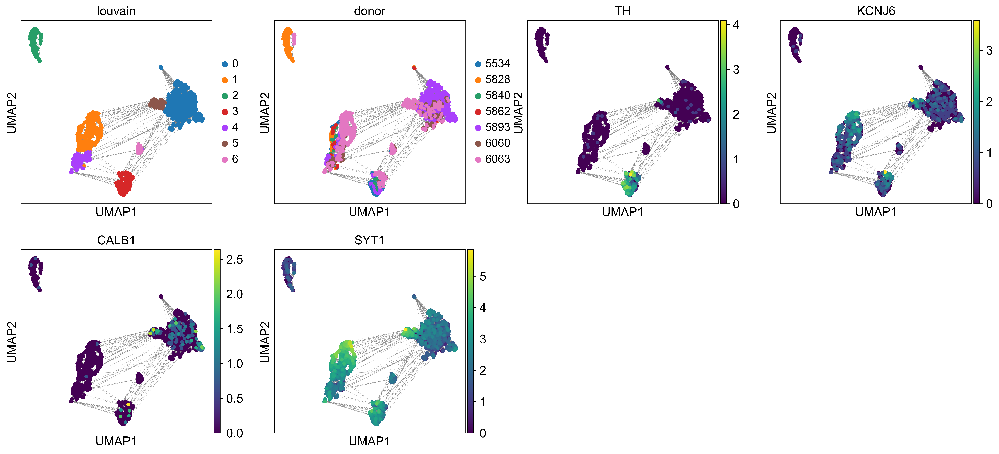

In [25]:
#sc.pl.umap(ann, color =['louvain','old_louvain','TH'])

ann_neurons = ann_welch[ann_welch.obs['Cell Types'] == 'Neurons'].copy()
ann_neurons.X = ann_neurons.raw.X
ann_test = ann_neurons
def analyse_ann(ann_test):
    sc.pp.calculate_qc_metrics(ann_test, inplace = True, percent_top=False)
    sc.pp.log1p(ann_test,copy=False)
    sc.pp.highly_variable_genes(ann_test)
    #ann_neurons.var['highly_variable'] = ann.var['highly_variable_intersection']
    sc.pp.pca(ann_test, use_highly_variable=True)
    sc.pp.neighbors(ann_test)
    # Check for connected components
    sc.tl.umap(ann_test)
    sc.tl.louvain(ann_test, resolution = 0.3)

analyse_ann(ann_test)
#sc.pl.pca_overview(ann)
#sc.tl.louvain(ann,resolution=0.3)

sc.pl.umap(ann_test,color = ['louvain', 'donor','TH','KCNJ6','CALB1','SYT1'], edges = True, use_raw = False)

#ann_test = ann_test[ann_test.obs['louvain'] != '2'].copy()

analyse_ann(ann_test)

ann_welch_A9 = ann_test.copy()

In [35]:
#sc.pl.umap(ann_test,color = ['louvain', 'donor','TH','KCNJ6','CALB1','SYT1','TPH1','SLC17A6','GAD2'], use_raw = False)



sc.tl.rank_genes_groups(ann_test, groupby='louvain', method='wilcoxon')

In [44]:
marker_genes = list(ann_test.uns['rank_genes_groups']['names']['4'])
sc.pl.umap(ann_test,color = ['louvain', 'donor','TH'] + marker_genes, edges = False, use_raw = False,show = False, save = 'markers.png')

In [47]:
sc.pl.umap(ann_test,color = ['louvain', 'donor','TH','SLC17A7','SLC17A6'], edges = False, use_raw = True, show = False, save = '-extra-markers.png')